In [1]:
import zipfile
from PIL import Image
import io
import matplotlib.pyplot as plt
import cv2
import numpy as np
import tensorflow as tf
import os
import random
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.layers import Input, Concatenate, Conv2D, MaxPooling2D, Flatten, Dense, RandomFlip, RandomRotation, RandomZoom, BatchNormalization,GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.applications import MobileNetV2
from scipy.optimize import minimize
from tensorflow.keras.regularizers import l2
import time

# Load Datasets

In [67]:
high_path = './high-quality'
low_path = './low-quality'
categories = ['real', 'fake']

data_high = []
data_low = []

for category in categories:
    high_folder_path = os.path.join(high_path, category)
    low_folder_path = os.path.join(low_path, category)
    label = 1 if category == 'real' else 0

    for file in os.listdir(high_folder_path):
        if file.endswith(('jpg', 'png', 'jpeg')):
            file_path = os.path.join(high_folder_path, file)
            image = Image.open(file_path).convert('RGB')
            data_high.append((image, label))

    for file in os.listdir(low_folder_path):
        if file.endswith(('jpg', 'png', 'jpeg')):
            file_path = os.path.join(low_folder_path, file)
            image = Image.open(file_path).convert('RGB')
            data_low.append((image, label))

## Show data examples : High quality 

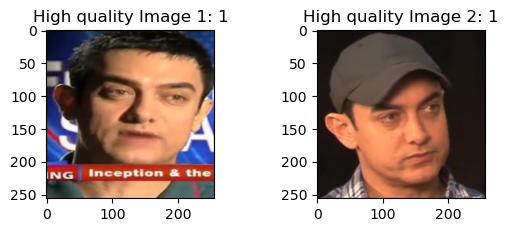

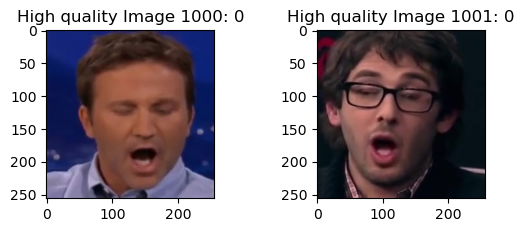

In [3]:
# Hight qulity 1 means real, 0 means fake
plt.subplot(2, 2, 1)  
plt.imshow(data_high[0][0], cmap='gray') 
plt.title(f'High quality Image 1: { data_high[0][1] }') 

plt.subplot(2, 2, 2) 
plt.imshow(data_high[1][0], cmap='gray')  
plt.title(f'High quality Image 2: { data_high[1][1] }') 
plt.show() 

plt.subplot(2, 2, 3)  
plt.imshow(data_high[1000][0], cmap='gray') 
plt.title(f'High quality Image 1000: { data_high[1000][1] }') 

plt.subplot(2, 2, 4) 
plt.imshow(data_high[1001][0], cmap='gray')  
plt.title(f'High quality Image 1001: { data_high[1001][1] }') 
plt.show() 

## Show data examples : Low quality 

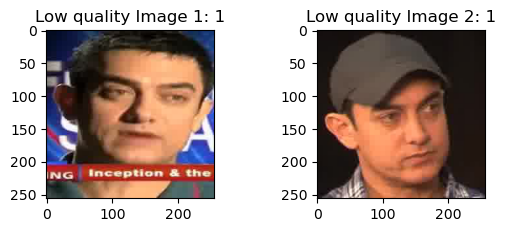

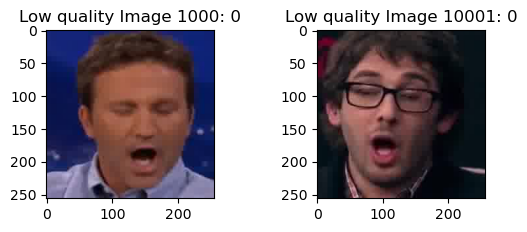

In [4]:
# Low qulity 1 means real, 0 means fake

plt.subplot(2, 2, 1)  
plt.imshow(data_low[0][0], cmap='gray') 
plt.title(f'Low quality Image 1: { data_low[0][1] }') 

plt.subplot(2, 2, 2) 
plt.imshow(data_low[1][0], cmap='gray')  
plt.title(f'Low quality Image 2: { data_low[1][1] }') 
plt.show() 

plt.subplot(2, 2, 3)  
plt.imshow(data_low[1000][0], cmap='gray') 
plt.title(f'Low quality Image 1000: { data_low[1000][1] }') 

plt.subplot(2, 2, 4) 
plt.imshow(data_low[1001][0], cmap='gray')  
plt.title(f'Low quality Image 10001: { data_low[1001][1] }') 
plt.show() 

# preprocess data

In [68]:
#The order of elements in the list is disrupted
random.shuffle(data_high)
random.shuffle(data_low)

In [69]:
global_image_dim=180
def preprocess_data(data):
    processed_images = []
    labels = []
    for image, label in data:
        image = np.array(image.resize((global_image_dim, global_image_dim)))
        processed_images.append(image)
        labels.append(label)
    return np.array(processed_images), np.array(labels)

processed_high, labels_high = preprocess_data(data_high)
processed_low, labels_low = preprocess_data(data_low)

def display_images(images, cols=6, titles=None):
    num_images = min(len(images), 18)  
    rows = num_images // cols + (1 if num_images % cols else 0)
    plt.figure(figsize=(18, 4 * rows))
    for i in range(num_images):
        image = images[i]
        plt.subplot(rows, cols, i + 1)
        if len(image.shape) == 2:  # 灰度图像
            plt.imshow(image, cmap='gray')
        else:  
            plt.imshow(image)
        if titles:
            plt.title(titles[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

Displaying processed images for low quality:


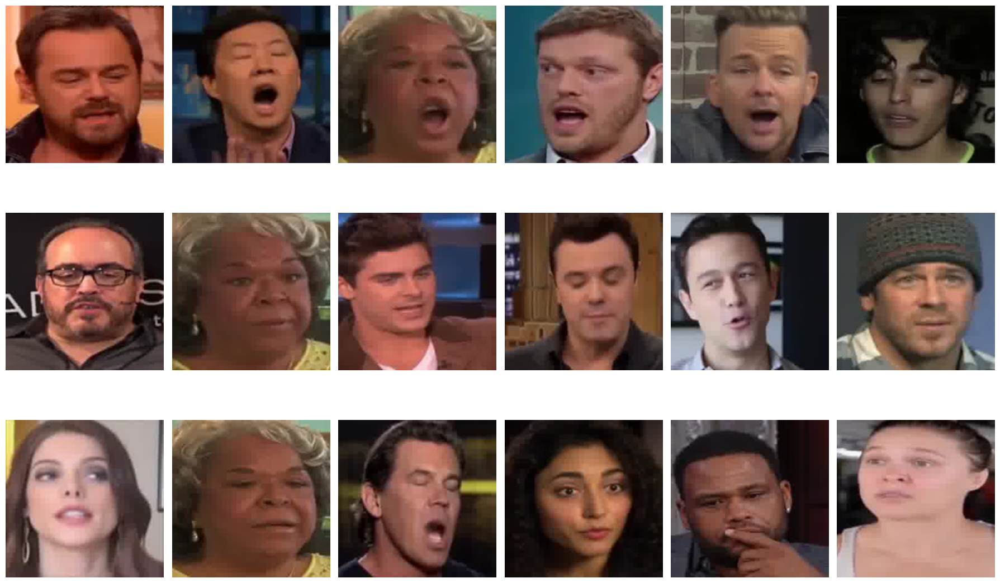

In [70]:
print("Displaying processed images for low quality:")
display_images(processed_low)

# Get CLAHE parameters : clip_limit, tile_grid_size

In [71]:
# Define image quality assessment functions (such as contrast)
def image_quality(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    contrast = gray.std()  # Use standard deviation as contrast metric
    return contrast

# Optimization function for finding the best CLAHE parameters
import concurrent.futures
from scipy.optimize import differential_evolution
def optimize_clahe_params_de(image):
    def objective(params):
        clip_limit, tile_grid_size = params
        try:
            img_clahe = apply_clahe(image, clip_limit, int(tile_grid_size))
            return -image_quality(img_clahe)  # Maximize contrast by minimizing the negative contrast
        except cv2.error:
            return np.inf  # Return a large value if there is an error
    bounds = [(1, 5), (1, 8)]  # Reduced bounds for faster optimization
    result = differential_evolution(objective, bounds, strategy='best1bin', maxiter=5, popsize=5, tol=0.01)
    return result.x

# Apply CLAHE

In [72]:
def apply_clahe(image, clip_limit, tile_grid_size):
    img_np = np.array(image)
    img_np = img_np[:, :, ::-1]  # Convert RGB to BGR
    img_lab = cv2.cvtColor(img_np, cv2.COLOR_BGR2Lab)  # Convert to Lab color space
    l, a, b = cv2.split(img_lab)  # Split into channels

    tile_grid_size_int = int(tile_grid_size)
    l = l.astype(np.uint8)  # Ensure that the L channel is an 8-bit unsigned integer type

    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=(tile_grid_size_int, tile_grid_size_int))
    l_clahe = clahe.apply(l)  # Apply to L channel

    # Ensure that the channels are of the same size before merging
    assert l_clahe.shape == a.shape == b.shape, "Channel shapes are not equal!"

    lab_clahe = cv2.merge((l_clahe, a, b))  # Merge back the channels
    img_clahe_bgr = cv2.cvtColor(lab_clahe, cv2.COLOR_Lab2BGR)  # Convert back to BGR
    img_clahe_rgb = img_clahe_bgr[:, :, ::-1]  # Convert BGR to RGB
    return np.array(Image.fromarray(img_clahe_rgb))


Displaying CLAHE enhanced images:


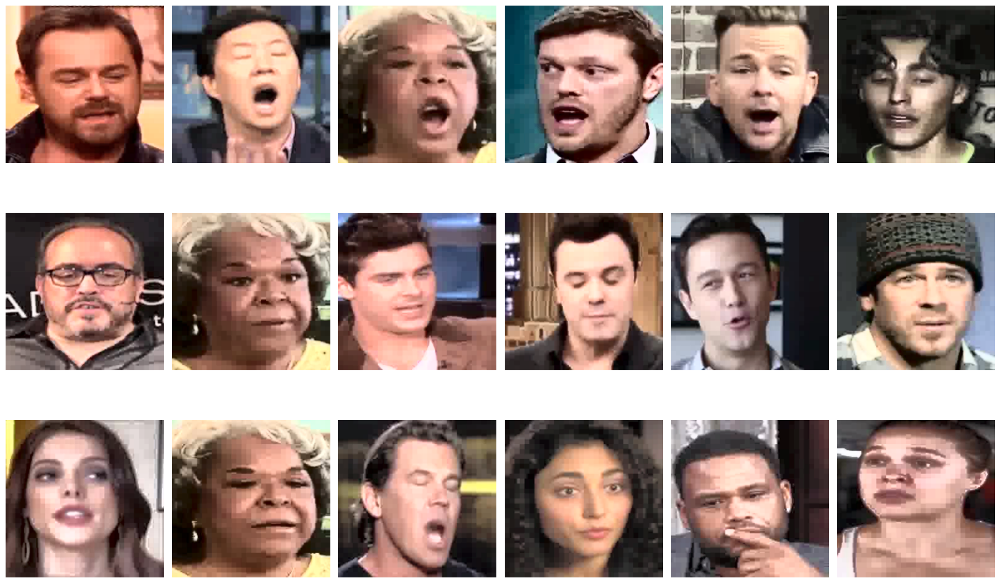

Time taken: 181.67040133476257 seconds


In [88]:
start_time = time.time()
optimal_clahe_params = [optimize_clahe_params_de(img) for img in processed_low]
enhanced_images_low = []
for i in range(len(processed_low)):
    img = processed_low[i]
    clip_limit, tile_grid_size = optimal_clahe_params[i]
    enhanced_image = apply_clahe(img, clip_limit, int(tile_grid_size))
    enhanced_images_low.append(enhanced_image)

    
# End timer
end_time = time.time()
# Display the CLAHE enhanced image
print("Displaying CLAHE enhanced images:")
display_images(enhanced_images_low)
print(f"Time taken: {end_time - start_time} seconds")

Displaying CLAHE enhanced images of high quality:


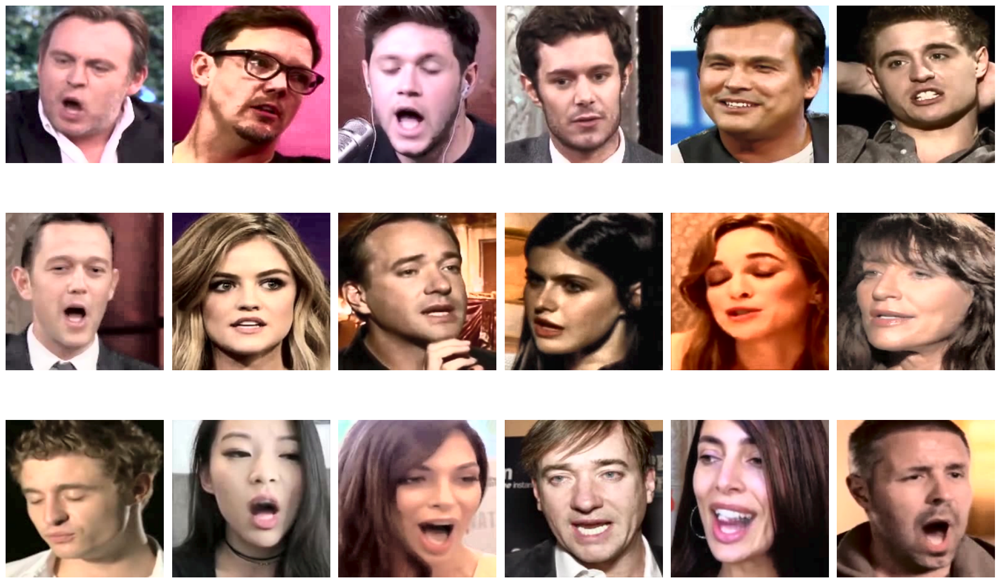

Time taken: 175.70412015914917 seconds


In [89]:
start_time = time.time()
optimal_clahe_params = [optimize_clahe_params_de(img) for img in processed_high]
enhanced_images_high = []
for i in range(len(processed_high)):
    img = processed_high[i]
    clip_limit, tile_grid_size = optimal_clahe_params[i]
    enhanced_image = apply_clahe(img, clip_limit, int(tile_grid_size))
    enhanced_images_high.append(enhanced_image)

    
# End timer
end_time = time.time()
# Display the CLAHE enhanced image
print("Displaying CLAHE enhanced images of high quality:")
display_images(enhanced_images_high)
print(f"Time taken: {end_time - start_time} seconds")

# Apply edge detection and morphological operations

Displaying processed low quality images after Canny and morphological operations:


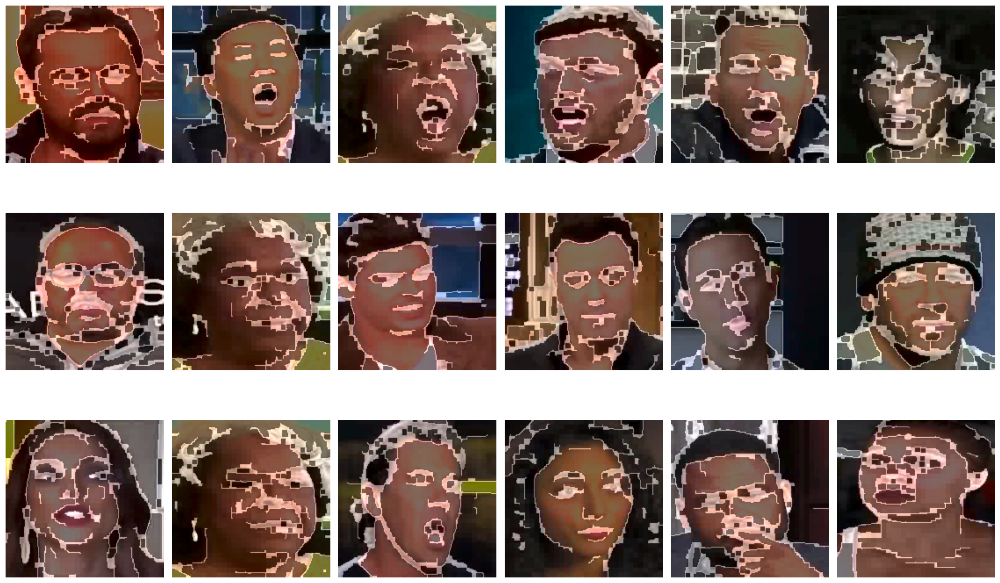

In [90]:
# Canny edge detection and morphological operations
def process_image(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray.astype(np.uint8), 100, 200) 
    kernel = np.ones((5, 5), np.uint8)
    dilation = cv2.dilate(edges, kernel, iterations=1)
    erosion = cv2.erode(dilation, kernel, iterations=1)
    erosion_expanded = np.expand_dims(erosion, axis=-1)  # 添加通道维度
    return erosion_expanded
def process_image_with_color(image):
    img_np = np.array(image)
    img_lab = cv2.cvtColor(img_np, cv2.COLOR_RGB2Lab)  # Convert to Lab color space
    l, a, b = cv2.split(img_lab)  # Split into channels

    # 对亮度通道应用边缘检测和形态学操作
    edges = cv2.Canny(l, 100, 200)  # Canny edge detection
    kernel = np.ones((5, 5), np.uint8)
    dilation = cv2.dilate(edges, kernel, iterations=1)
    erosion = cv2.erode(dilation, kernel, iterations=1)

    # 将处理后的亮度通道与原始的颜色通道合并
    l = cv2.addWeighted(l, 0.5, erosion, 0.5, 0)  # Combine processed L with original L
    img_processed = cv2.merge((l, a, b))  # Merge back into Lab image
    img_processed_rgb = cv2.cvtColor(img_processed, cv2.COLOR_Lab2RGB)  # Convert back to RGB

    return img_processed_rgb

processed_images_Low = [process_image_with_color(img) for img in enhanced_images_low]
# Display all processed images
print("Displaying processed low quality images after Canny and morphological operations:")
display_images(processed_images_Low)

Displaying processed high quality images after Canny and morphological operations:


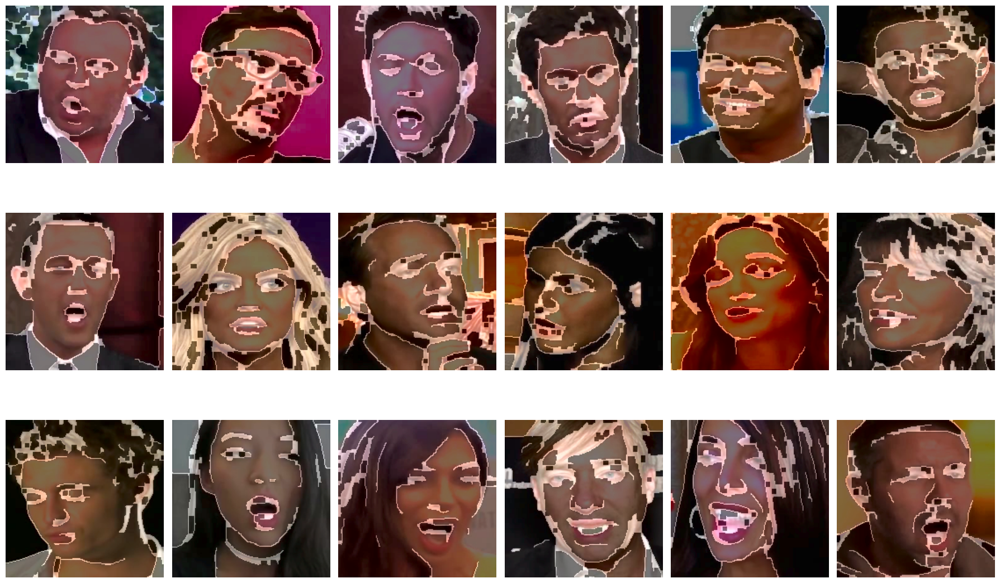

In [91]:
processed_images_high = [process_image_with_color(img) for img in enhanced_images_high]
# Display all processed images
print("Displaying processed high quality images after Canny and morphological operations:")
display_images(processed_images_high)

# Build Model

In [111]:
def build_model(input_shape):
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu', kernel_regularizer=l2(0.001))(x)
    x = Dropout(0.5)(x)
    x = Dense(256, activation='relu', kernel_regularizer=l2(0.001))(x)
    x = Dropout(0.5)(x)
    predictions = Dense(2, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

def get_model(num_classes = 2):
    # input_shape = (global_image_dim, global_image_dim, 3)  
    # model = build_model(input_shape)
    # return model
    
    data_augmentation = keras.Sequential(
      [
        layers.RandomFlip("horizontal",
                          input_shape=(global_image_dim,
                                      global_image_dim,
                                      3)),
    RandomRotation(0.1),
    #RandomZoom(0.1),
      ]
    )

    model = Sequential([
          data_augmentation,
          # layers.Rescaling(1./255),
          layers.Conv2D(64, 3, padding='same', activation='relu'),
          layers.MaxPooling2D(),
          layers.Conv2D(128, 3, padding='same', activation='relu'),
          layers.MaxPooling2D(),
          layers.Conv2D(256, 3, padding='same', activation='relu'),
          layers.MaxPooling2D(),
          layers.Conv2D(256, 3, padding='same', activation='relu'),
          layers.MaxPooling2D(),
          layers.Dropout(0.2),
          layers.Flatten(),
          layers.Dense(256, activation='relu'),
          layers.Dense(num_classes, name="outputs")
        ])

    model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
    return model
model = get_model()



# Train Model on low quality enhanced images

In [101]:
X_train_low_c, X_test_low_c, y_train_low_c, y_test_low_c = train_test_split(enhanced_images_low, labels_low, test_size=0.2) #low quality CLAHE enhanced
X_train_high_c, X_test_high_c, y_train_high_c, y_test_high_c = train_test_split(enhanced_images_high, labels_high, test_size=0.2) #high quality CLAHE enhanced

X_train_low_a, X_test_low_a, y_train_low_a, y_test_low_a = train_test_split(processed_images_Low, labels_low, test_size=0.2) #low quality enhanced after all processed 
X_train_high_a, X_test_high_a, y_train_high_a, y_test_high_a = train_test_split(processed_images_high, labels_high, test_size=0.2) #high quality enhanced after all processed 

X_train_low_raw, X_test_low_raw, y_train_low_raw, y_test_low_raw = train_test_split(processed_low, labels_low, test_size=0.2) #raw low quality
X_train_high_raw, X_test_high_raw, y_train_high_raw, y_test_high_raw = train_test_split(processed_high, labels_high, test_size=0.2) #raw high quality

In [102]:
X_train_low_c = np.array(X_train_low_c)
y_train_low_c = np.array(y_train_low_c)
X_test_low_c = np.array(X_test_low_c)
y_test_low_c = np.array(y_test_low_c)

X_train_high_c = np.array(X_train_high_c)
y_train_high_c = np.array(y_train_high_c)
X_test_high_c = np.array(X_test_high_c)
y_test_high_c = np.array(y_test_high_c)

X_train_low_a = np.array(X_train_low_a)
y_train_low_a = np.array(y_train_low_a)
X_test_low_a = np.array(X_test_low_a)
y_test_low_a = np.array(y_test_low_a)

X_train_high_a = np.array(X_train_high_a)
y_train_high_a = np.array(y_train_high_a)
X_test_high_a = np.array(X_test_high_a)
y_test_high_a = np.array(y_test_high_a)

X_train_low_raw = np.array(X_train_low_raw)
y_train_low_raw = np.array(y_train_low_raw)
X_test_low_raw = np.array(X_test_low_raw)
y_test_low_raw = np.array(y_test_low_raw)

X_train_high_raw = np.array(X_train_high_raw)
y_train_high_raw = np.array(y_train_high_raw)
X_test_high_raw = np.array(X_test_high_raw)
y_test_high_raw = np.array(y_test_high_raw)


print(f"X_train_low_c shape: {X_train_low_c.shape}, y_train_low_c shape: {y_train_low_c.shape}")
print(f"X_test_low_c shape: {X_test_low_c.shape}, y_test_low_c shape: {y_test_low_c.shape}\n")

print(f"X_train_high_c shape: {X_train_high_c.shape}, y_train_high_c shape: {y_train_high_c.shape}")
print(f"X_test_high_c shape: {X_test_high_c.shape}, y_test_high_c shape: {y_test_high_c.shape}\n")

print(f"X_train_low_a shape: {X_train_low_a.shape}, y_train_low_a shape: {y_train_low_a.shape}")
print(f"X_test_low_a shape: {X_test_low_a.shape}, y_test_low_a shape: {y_test_low_a.shape}\n")

print(f"X_train_high_a shape: {X_train_high_a.shape}, y_train_high_a shape: {y_train_high_a.shape}")
print(f"X_test_high_a shape: {X_test_high_a.shape}, y_test_high_a shape: {y_test_high_a.shape}\n")

print(f"X_train_low_raw shape: {X_train_low_raw.shape}, y_train_low_raw shape: {y_train_low_raw.shape}")
print(f"X_test_low_raw shape: {X_test_low_raw.shape}, y_test_low_raw shape: {y_test_low_raw.shape}")

print(f"X_train_high_raw shape: {X_train_high_raw.shape}, y_train_high_raw shape: {y_train_high_raw.shape}")
print(f"X_test_high_raw shape: {X_test_high_raw.shape}, y_test_high_raw shape: {y_test_high_raw.shape}")


X_train_low_c shape: (1381, 180, 180, 3), y_train_low_c shape: (1381,)
X_test_low_c shape: (346, 180, 180, 3), y_test_low_c shape: (346,)

X_train_high_c shape: (1381, 180, 180, 3), y_train_high_c shape: (1381,)
X_test_high_c shape: (346, 180, 180, 3), y_test_high_c shape: (346,)

X_train_low_a shape: (1381, 180, 180, 3), y_train_low_a shape: (1381,)
X_test_low_a shape: (346, 180, 180, 3), y_test_low_a shape: (346,)

X_train_high_a shape: (1381, 180, 180, 3), y_train_high_a shape: (1381,)
X_test_high_a shape: (346, 180, 180, 3), y_test_high_a shape: (346,)

X_train_low_raw shape: (1381, 180, 180, 3), y_train_low_raw shape: (1381,)
X_test_low_raw shape: (346, 180, 180, 3), y_test_low_raw shape: (346,)
X_train_high_raw shape: (1381, 180, 180, 3), y_train_high_raw shape: (1381,)
X_test_high_raw shape: (346, 180, 180, 3), y_test_high_raw shape: (346,)


In [103]:
def train_and_evaluate_model(model, X_train, y_train, X_test, y_test, batch_size=64, epochs=10):
    history = model.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, validation_data=(X_test, y_test))
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"Test Loss: {loss}, Test Accuracy: {accuracy}")

    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()

    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()
    plt.show()

model = build_model(input_shape=(global_image_dim,global_image_dim, 3))

C:\Users\28612\AppData\Local\Temp\ipykernel_22796\2604109231.py:2: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)


Epoch 1/30
22/22 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.4925 - loss: 266.6281 - val_accuracy: 0.5723 - val_loss: 0.7428
Epoch 2/30
22/22 ━━━━━━━━━━━━━━━━━━━━ 49s 2s/step - accuracy: 0.5038 - loss: 0.7885 - val_accuracy: 0.5867 - val_loss: 0.6876
Epoch 3/30
22/22 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - accuracy: 0.5362 - loss: 0.6926 - val_accuracy: 0.5867 - val_loss: 0.6848
Epoch 4/30
22/22 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.5650 - loss: 0.6865 - val_accuracy: 0.7023 - val_loss: 0.6307
Epoch 5/30
22/22 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.6480 - loss: 0.6352 - val_accuracy: 0.7254 - val_loss: 0.6052
Epoch 6/30
22/22 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.6756 - loss: 0.6169 - val_accuracy: 0.7514 - val_loss: 0.5310
Epoch 7/30
22/22 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.7017 - loss: 0.5694 - val_accuracy: 0.7775 - val_loss: 0.5018
Epoch 8/30
22/22 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step - accuracy: 0.7632 - loss: 0.5366 - val_accuracy: 0.8092 - val_los

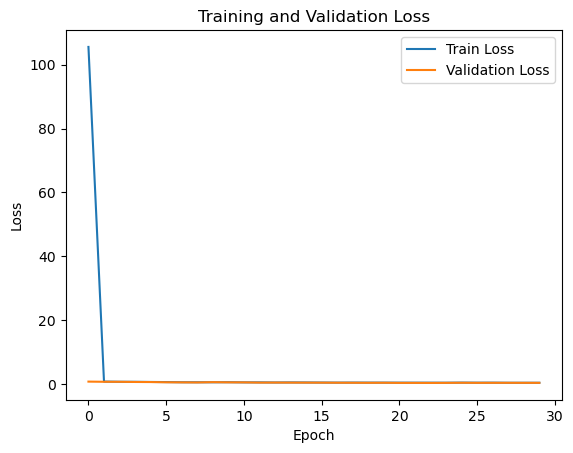

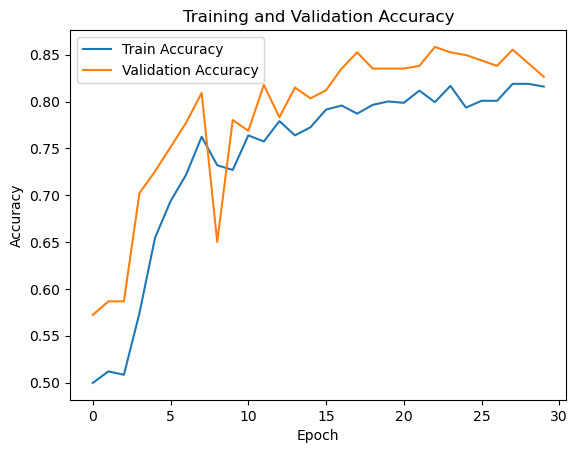

In [112]:
start_time = time.time()
train_and_evaluate_model(model, X_train_low_c, y_train_low_c, X_test_low_c, y_test_low_c, epochs=30)
end_time = time.time()
duration = end_time - start_time

In [113]:
print(duration)

1325.6655242443085


Epoch 1/30
22/22 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.5889 - loss: 0.8730 - val_accuracy: 0.6936 - val_loss: 0.6275
Epoch 2/30
22/22 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.6891 - loss: 0.5813 - val_accuracy: 0.7283 - val_loss: 0.6335
Epoch 3/30
22/22 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.7395 - loss: 0.5413 - val_accuracy: 0.7341 - val_loss: 0.5416
Epoch 4/30
22/22 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.7432 - loss: 0.5263 - val_accuracy: 0.7428 - val_loss: 0.5279
Epoch 5/30
22/22 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.7403 - loss: 0.5146 - val_accuracy: 0.7081 - val_loss: 0.5179
Epoch 6/30
22/22 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.7463 - loss: 0.4923 - val_accuracy: 0.7168 - val_loss: 0.5150
Epoch 7/30
22/22 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.7671 - loss: 0.4675 - val_accuracy: 0.7543 - val_loss: 0.5122
Epoch 8/30
22/22 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.8146 - loss: 0.4313 - val_accuracy: 0.7399 - val_loss:

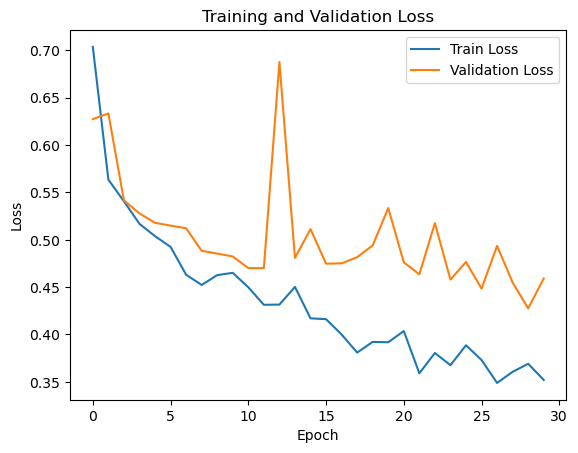

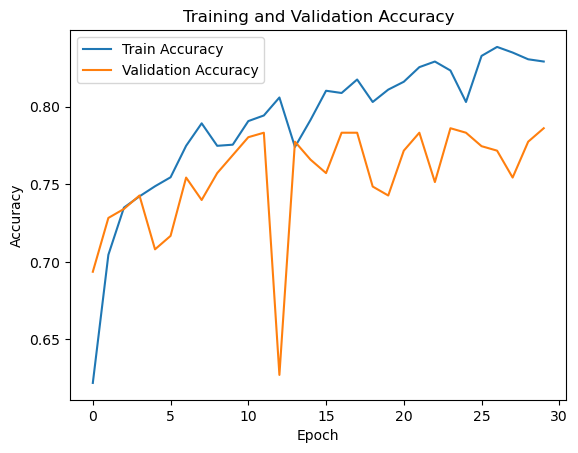

In [114]:
start_time = time.time()
train_and_evaluate_model(model, X_train_low_a, y_train_low_a, X_test_low_a, y_test_low_a, epochs=30)
end_time = time.time()
duration = end_time - start_time

In [115]:
print(duration)

1314.8441207408905


# Train Model on high quality images

# Train Model on high quality processed images

# Train Model on high quality raw images